In [ ]:
# Download libraries (Note skillner is a large package around 500MB)
!pip install pandas
!pip install wordcloud
!pip install fuzzywuzzy
!pip install -U scikit-learn
!python -m pip install -U matplotlib
!pip install regex
!pip install seaborn
!pip install nltk
!pip install skillNer
!python -m spacy download en_core_web_lg

In [ ]:
from fuzzywuzzy import fuzz
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import CountVectorizer
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN, KMeans
from sklearn.preprocessing import normalize
from sklearn.impute import SimpleImputer
from scipy.spatial.distance import euclidean
from scipy import zeros
import scipy.cluster.hierarchy as sch
from wordcloud import WordCloud
from wordcloud import ImageColorGenerator
from wordcloud import STOPWORDS
import matplotlib.pyplot as plt
import nltk.corpus
import re
from nltk.corpus import stopwords
import pandas as pd
import numpy as np
import seaborn as sns
import spacy
import json
from spacy.matcher import PhraseMatcher
from skillNer.general_params import SKILL_DB
from skillNer.skill_extractor_class import SkillExtractor
from html.parser import HTMLParser
from numpy.ma.mrecords import fromarrays
import time
import re
import math
import seaborn as sns


: 

# Data Cleaning / Engineering

Get the results from the Indeed_webscrapping results

In [2]:
df = pd.read_csv('webscraping_results_assignmnet3.csv')

In [ ]:
df.head()

In [4]:
df = df[df['Descriptions'] != 'error']
df = df.reset_index()

In [5]:
df.shape

(1235, 10)

In [ ]:
df.info()

# Exploratory data analyis and feature engineering

## Extract Job Titles / Cleaning

From the table above, we can see that some job position are written a bit different for example: Microsoft Dynamics Business Analyst and Business Analyst or some job are adding description in the title such as remote. We will clean the job title names and group them together.

In [7]:
df['Title'].unique()[:26]

array(['Microsoft Dynamics Business Analyst', 'Business Analyst',
       'Software Business Analyst - REMOTE', 'Business Data Analyst',
       'IT Business Analyst', 'Sales Analyst (North of Chicago)',
       'Business Analyst for Web Development Firm',
       'Business Analyst - Transit Authority',
       'Business Intelligence Analyst (Power BI) (Remote)',
       'Business Analyst - New Acquisition Integration',
       'Business Analyst (PowerApps)', 'Salesforce Business Analyst',
       'Business Analyst IV', 'Business Analyst - Remote',
       'Business Analyst I (Contingent)',
       'Technical Business Analyst Investments',
       'Technical Data Science Program Manager',
       'Senior Data Science Manager', 'Manager - Data Science',
       'Data Science Manager', 'Senior Manager-Data Science',
       'Manager, Data Science & Analytics, Central Analytics',
       'Lead Data Engineer', 'Data Science - Engagement Manager',
       'URBN Project Manager - Data Science', 'Manager of 

In [8]:
df['Title'].nunique()

170

We will put all the words in lower case in the table and our position list.

In [9]:
# Lowe case job titles
df['Title'] = df['Title'].str.lower()

# Initial scrape
position_list = ['data scientist', 'data analyst', 'machine learning engineer',
                 'AI Engineer','AI system designer', 'manager of analytics',
                 'director of analytics','data science manager','business analyst',
                ]

# Lower case inital scrape list
position_list = [position.lower() for position in position_list]

We use fuzz to compare the job title to the 10 position list that were searched on Indeed. The position name is replaced with the one with the highest score.

In [10]:
# Get Title index

for index,i in enumerate(df.columns):
    if i == "Title":
        col_indexer = index
        break

max_score = 0

# Loop through all position titles
for i in range(len(df['Title'])):
    # Loop through original title to find best match
    for position in position_list:
        #score = fuzz.ratio(df['Title'].iloc[i], position)
        score = fuzz.ratio(df.loc[i,'Title'], position)
        if score > max_score:
            max_score = score
            best_match = position
    
    
        
    # Replace title with best match
    df.loc[i,'Title'] = best_match
    #df['Title'].iloc[i] = best_match
  
        
    #df.loc[i,'Title'] = best_match
    # Reset max_score    
    max_score = 0


In [11]:
df['Title'].unique()

array(['business analyst', 'data science manager', 'manager of analytics',
       'ai engineer', 'data scientist', 'director of analytics',
       'ai system designer', 'machine learning engineer', 'data analyst'],
      dtype=object)

We confirm that the job titles were modified and we now have 10 unique job titles

##  Distribution by Job Title

In [12]:
def plot_distribution(df,feature,xlab,ylabl,title,xrot = 0):
    plt.figure(figsize=(10,10))
    plot = sns.countplot(x=feature,data=df)

    plot.tick_params(labelsize= 15)
    plt.xticks(rotation=xrot)
    plot.set_xlabel(xlab, size = 20)
    plot.set_ylabel(ylabl, size = 20)
    plot.set_title(title,size = 30)

    plt.tight_layout()
    plt.show()

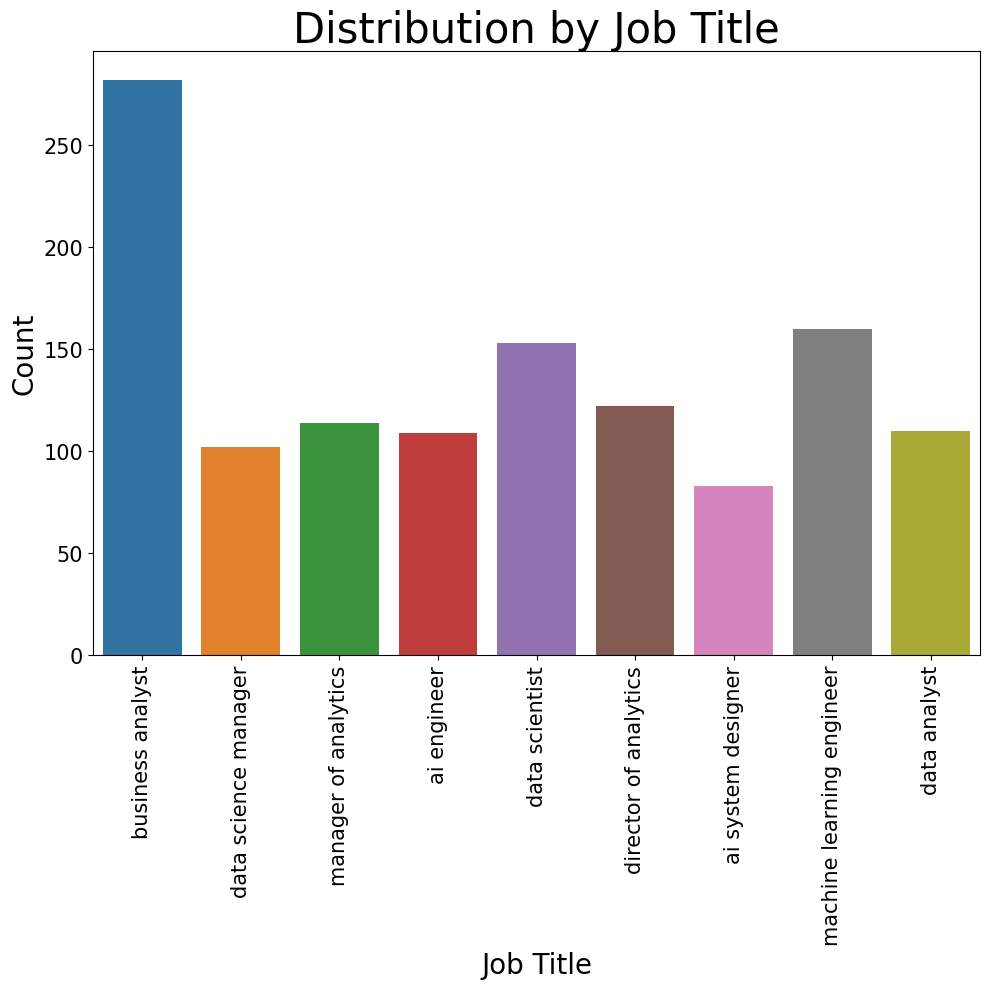

In [13]:
plot_distribution(df,"Title","Job Title","Count","Distribution by Job Title", xrot = 90) 

## Cleaning Descriptions

In [14]:
nltk.download('stopwords')

df_clean = df.copy()
# Clean text data
df_clean['Descriptions'] = df_clean['Descriptions'].apply(lambda x: re.split('https:\/\/.*', str(x))[0])

# Put all words to lower case 
df_clean['Descriptions'] = df_clean['Descriptions'].str.lower()

#Removing stop words
stop = stopwords.words('english')
df_clean['Descriptions'] = df_clean['Descriptions'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))

#Remove unicode characters
df_clean['Descriptions']=df_clean['Descriptions'].str.encode('ascii', 'ignore').str.decode('ascii')

# Removes rt @
df_clean['Descriptions'] = df_clean['Descriptions'].str.replace('rt @[^\s]*',"")

# Remove @username left
df_clean['Descriptions'] = df_clean['Descriptions'].str.replace('@[^\s]*',"")

#Removes any punctuation
df_clean['Descriptions'] = df_clean['Descriptions'].str.replace(r'[^\w\s]+', '')

# Remove numbers
df_clean['Descriptions'] = df_clean['Descriptions'].str.replace('\d+', '')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\alexi\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
C:\Users\alexi\AppData\Local\Temp\ipykernel_9032\2088683801.py:18: FutureWarning: The default value of regex will change from True to False in a future version.
  df_clean['Descriptions'] = df_clean['Descriptions'].str.replace('rt @[^\s]*',"")
C:\Users\alexi\AppData\Local\Temp\ipykernel_9032\2088683801.py:21: FutureWarning: The default value of regex will change from True to False in a future version.
  df_clean['Descriptions'] = df_clean['Descriptions'].str.replace('@[^\s]*',"")
C:\Users\alexi\AppData\Local\Temp\ipykernel_9032\2088683801.py:24: FutureWarning: The default value of regex will change from True to False in a future version.
  df_clean['Descriptions'] = df_clean['Descriptions'].str.replace(r'[^\w\s]+', '')
C:\Users\alexi\AppData\Local\Temp\ipykernel_9032\2088683801.py:27: FutureWarning: The default value of regex wi

## Get hard skill, soft skills, and certifications

In this section, we extract the soft skills, hard skills and certification of the job description using the SkillNER package https://github.com/AnasAito/SkillNER.

In [15]:
# add an empty columns
df_skills = df_clean.reindex(columns = df_clean.columns.tolist()
                                  + ['Soft Skills','Hard Skills', 'Certifications'])

In [16]:
# Initialize parameters 
nlp = spacy.load('en_core_web_lg')
# init skill extractor
skill_extractor = SkillExtractor(nlp, SKILL_DB, PhraseMatcher)

loading full_matcher ...
loading abv_matcher ...
loading full_uni_matcher ...
loading low_form_matcher ...
loading token_matcher ...


In [17]:
### If the step above did not work, make sure that the package is correctly downloaded.
#spacy.cli.download("en_core_web_sm")
#spacy.load('en_core_web_sm')

In the code underneath, we see how skillner extracts soft, hard skills from the first description. It can also extract certifcation from job description. However, the output from skillner is an html. Hence, we cannot just grab those words. We can get the id of each words and after go in the json file and verify it belongs in which category.

In [ ]:
annotation = skill_extractor.annotate(df_skills['Descriptions'][0])
skill_extractor.describe(annotation)

The following is the dictonnary output that annotation returns. This well help understand the code underneath:

The skill_db_relax_20.json file contains information for each words in annotation. Each words has a skill_id and mapped to it, it has the skill_type 

In [20]:
df_skills_split_skills = df_skills.copy()

The following code has used SkillNer to extract Soft skills, Hard Skills and Certification for each rows. However, it took 2 hours to extract everything. Hence, the code was commented and the results were saved as a CSV file.

Since it takes quite a bit of time to go analyze each descriptions, (Execution time in seconds: 7940.129331588745). We saved the output in a csv name data_extracted_skills and we will use that when we continue the analysis.

In [22]:
# When extracting the skills, I added a space after each comma. We will run this little code to remove those spaces.
def remove_space(column):
    for index,skill in enumerate(df_skills_extract[column]):
        if type(df_skills_extract.loc[index,column]) != str:
            continue
        df_skills_extract.loc[index,column] = df_skills_extract.loc[index,column].replace(", ",",") 
remove_space("Soft Skills")
remove_space("Hard Skills")
remove_space("Certifications")

In [23]:
df_skills_extract.head()

,Unnamed: 0,index,Title,Company,Location,Rating,Date,Salary,Description,Links,Descriptions,Soft Skills,Hard Skills,Certifications
0,0,0,business analyst,QVC,"West Chester, OH+2 locations",3.6,PostedPosted 30+ days ago,NaN,3+ years of experience as business analyst on ...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,cornerstone brands looking hire passionate ene...,"customer service,interpersonal communication","process model,system development,cost benefit ...",NaN
1,1,1,business analyst,Sabot Consulting,Remote,NaN,PostedToday,$80 - $120 an hour,Preferred candidates will have prior experienc...,https://www.indeed.com/rc/clk?jk=f662b2efb509b...,sabot consulting sabot management consulting c...,"information technology,microsoft office","business process,process migration,scope manag...","lean six sigma green belt,iiba,six sigma green..."
2,2,2,business analyst,Gateway Ticketing,"Remote in Gilbertsville, PA 19525+1 location",NaN,PostedPosted 1 day ago,NaN,"ARE YOU LOOKING TO DO GREAT WORK IN A DYNAMIC,...",https://www.indeed.com/rc/clk?jk=8232a34f09ffd...,looking great work dynamic fun collaborative e...,"quality assurance,microsoft office,program man...","sprint retrospective,conflict management,emplo...",NaN
3,3,3,business analyst,nLeague Services Inc.,"Remote in Salem, OR 97302+3 locations",NaN,EmployerActive 2 days ago,$65 - $70 an hour,"Location: 955 Center St NE Salem, Oregon, 9730...",https://www.indeed.com/rc/clk?cmp=IT-%2F-Healt...,business analyst location center st ne salem ...,NaN,"business analysis,job description,software dev...",NaN
4,4,4,business analyst,RPO International,"Houston, TX 77075 (South Belt - Ellington area...",NaN,Hiring ongoing,$50 - $60 an hour,Incumbent organization who will fulfil busines...,https://www.indeed.com/company/RPO-Internation...,project description undertaking complex initia...,NaN,"business process,business process mapping,stak...",NaN


## Visualize (Word Cloud)

In [24]:
# Create text list for each column

text_soft_skills = " ".join(soft_skills for soft_skills in df_skills_extract["Soft Skills"].astype(str))
text_hard_skills = " ".join(hard_skills for hard_skills in df_skills_extract["Hard Skills"].astype(str))
text_certification_skills = " ".join(certification_skills for certification_skills in df_skills_extract["Certifications"].astype(str))
text_all_skills = text_soft_skills + text_hard_skills + text_certification_skills

In [25]:
def cloud_map(text,title):
    
    wordcloud = WordCloud(background_color="white", width=800, height=400).generate(text)

    # Display the generated image:
    # the matplotlib way:

    plt.figure( figsize=(40,20))
    #plt.tight_layout(pad=0)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(title, fontsize = 75)
    plt.show()

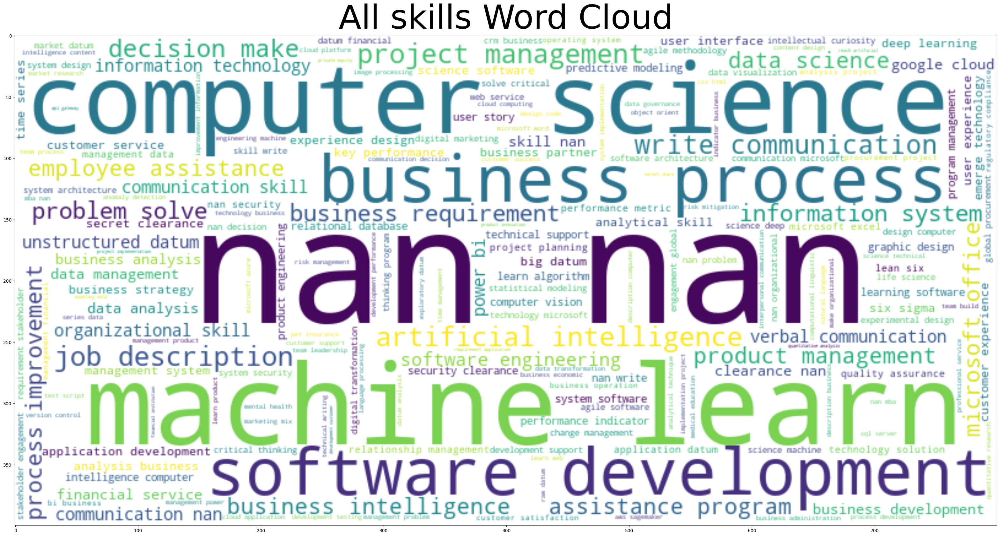

In [26]:
cloud_map(text_all_skills, "All skills Word Cloud")

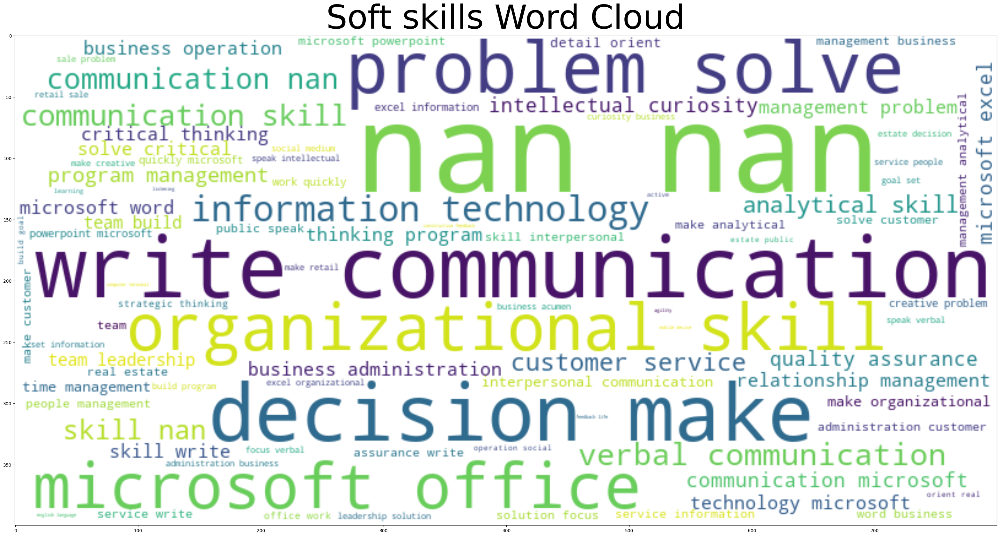

In [27]:
cloud_map(text_soft_skills, "Soft skills Word Cloud")

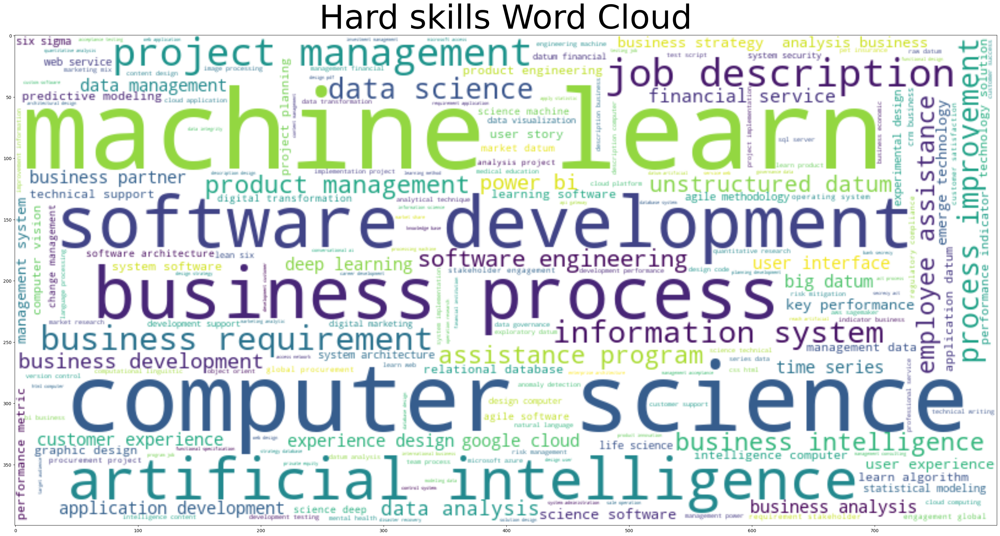

In [28]:
cloud_map(text_hard_skills, "Hard skills Word Cloud")

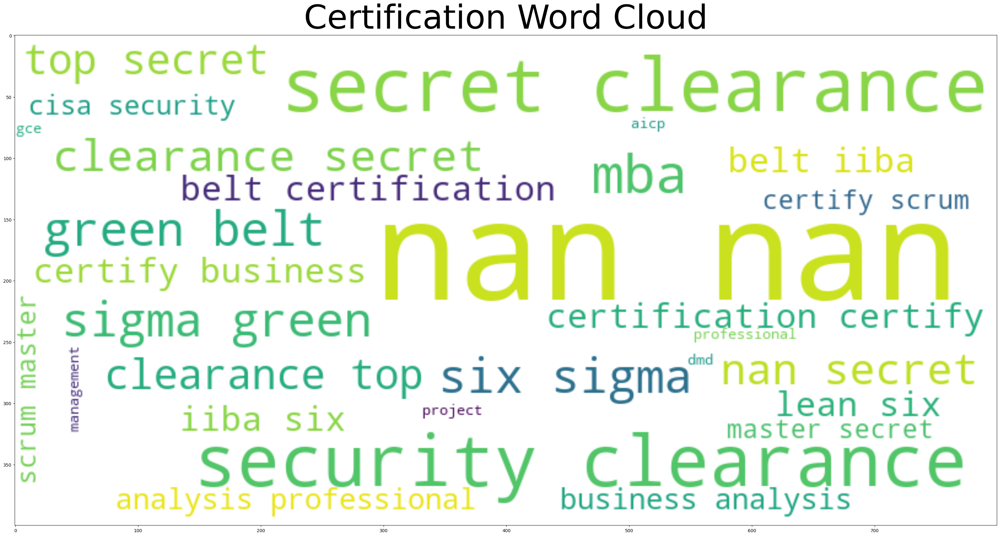

In [29]:
cloud_map(text_certification_skills, "Certification Word Cloud")

From the wordcloud, we were able to extract important skills in the job description for the soft and hard skill and certifications. The following are some important that had more weights in the presented wordcloud:
- Soft Skills ('communication', 'write', 'organization skills', 'problem solve', 'decision make')
- Hard Skills ('machine learn', 'project management', 'artificial intelligence', 'computer vision', 'deep learning', 'power bi', 'google cloud', 'predictive modeling', 'data analysis', 'business analysis')
- Certification ('green belt', 'iiba', 'scrum master', 'mba', 'cisa security')

Looking at the word cloud, it seems that the package skillNer might overlooked some technical skills such as Python, matlab ... We will go through the descriptions, if the following skills are in the description, they will be added in the hard skill.

- Hard skill to add ['python','sql','matlab','java','devops','scala','scikit-learn','tensorflow','keras','regression','nlp','neural network','rnn','cnn','kaggle','tableau']

In [30]:
hard_skill_add = ['python','sql','matlab','java','devops','scala','scikit-learn','tensorflow','keras','regression','nlp','neural network','rnn','cnn','kaggle','tableau']

In [31]:
# Loop through each hard skill we want to add, if present in column, add it to hard skill
df_skill_update = df_skills_extract.copy()

for i in hard_skill_add:
    # Loop through each rows
    for j in range(len(df_skill_update)):
            if i in df_skill_update['Descriptions'][j]:
                if type(df_skill_update.loc[j,'Hard Skills']) != str:
                    continue
                df_skill_update.loc[j,'Hard Skills'] = df_skill_update.loc[j,'Hard Skills'] + "," + i
          

In [32]:
df_skill_update.head()

,Unnamed: 0,index,Title,Company,Location,Rating,Date,Salary,Description,Links,Descriptions,Soft Skills,Hard Skills,Certifications
0,0,0,business analyst,QVC,"West Chester, OH+2 locations",3.6,PostedPosted 30+ days ago,NaN,3+ years of experience as business analyst on ...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,cornerstone brands looking hire passionate ene...,"customer service,interpersonal communication","process model,system development,cost benefit ...",NaN
1,1,1,business analyst,Sabot Consulting,Remote,NaN,PostedToday,$80 - $120 an hour,Preferred candidates will have prior experienc...,https://www.indeed.com/rc/clk?jk=f662b2efb509b...,sabot consulting sabot management consulting c...,"information technology,microsoft office","business process,process migration,scope manag...","lean six sigma green belt,iiba,six sigma green..."
2,2,2,business analyst,Gateway Ticketing,"Remote in Gilbertsville, PA 19525+1 location",NaN,PostedPosted 1 day ago,NaN,"ARE YOU LOOKING TO DO GREAT WORK IN A DYNAMIC,...",https://www.indeed.com/rc/clk?jk=8232a34f09ffd...,looking great work dynamic fun collaborative e...,"quality assurance,microsoft office,program man...","sprint retrospective,conflict management,emplo...",NaN
3,3,3,business analyst,nLeague Services Inc.,"Remote in Salem, OR 97302+3 locations",NaN,EmployerActive 2 days ago,$65 - $70 an hour,"Location: 955 Center St NE Salem, Oregon, 9730...",https://www.indeed.com/rc/clk?cmp=IT-%2F-Healt...,business analyst location center st ne salem ...,NaN,"business analysis,job description,software dev...",NaN
4,4,4,business analyst,RPO International,"Houston, TX 77075 (South Belt - Ellington area...",NaN,Hiring ongoing,$50 - $60 an hour,Incumbent organization who will fulfil busines...,https://www.indeed.com/company/RPO-Internation...,project description undertaking complex initia...,NaN,"business process,business process mapping,stak...",NaN


## Bar chart (skills per job) 

In [33]:
def unique_skill(column):
    '''
    Find unique skills in each column (hard, soft and certification)
    input:
    column name: str
    return all skills and set of skills
    
    '''
    unique_skill = []

    for index, skill in enumerate(df_skill_update[column]):
        if type(df_skill_update[column][index]) != str:
            continue
            
        soft_skill = df_skill_update[column][index]
        soft_skill_list = soft_skill.split(",")

        for j in soft_skill_list:
            unique_skill.append(j)
   

    return unique_skill, set(unique_skill)

def dict_skill(skills_unique):
    '''
    Initialise dictionnary for Soft, Hard, and Unique skills containing all unique skills.
    Input:
    skills_unique: Set of unique skills/certification
    Return:
    Dictionary containing all unique skill / certification with initial count to 0
    '''
    dict_job_skill = {}
    for i in skills_unique:
        dict_job_skill[i] = 0
        
    return dict_job_skill

def dict_count_skill(dictionary,skill_list):
    '''
    Count number of time skill appears in table
    Input:
    dictonary -> dict containing skills and count
    skill_list -> list containing all skills from table (contain duplicates)
    return:
    dictionary with skills and count
    
    '''
    # Reset dictionary values to 0
    
    dictionary = dict.fromkeys(dictionary, 0)
    
    for skill,count in dictionary.items():
        count = skill_list.count(skill)
        dictionary[skill] += count
        
    return dictionary

In [34]:
# Call function and get all skills and unique skills/certification
Soft_skill_all,Soft_skill_unique = unique_skill("Soft Skills")
Hard_skill_all,Hard_skill_unique = unique_skill("Hard Skills")
Certification_all,Certification_unique = unique_skill("Certifications")

In [35]:
# Create dictionary for soft, hard and certification
dict_soft_skill = dict_skill(Soft_skill_unique)
dict_hard_skill = dict_skill(Hard_skill_unique)
dict_certification_skill = dict_skill(Certification_unique)

In [36]:
# Call dictionary function to count occurence of time for each skills / certification
dict_soft_skill = dict_count_skill(dict_soft_skill,Soft_skill_all)
dict_hard_skill = dict_count_skill(dict_hard_skill,Hard_skill_all)
dict_certification_skill = dict_count_skill(dict_certification_skill,Certification_all)


In [37]:
# Sort dictionnaries
dict_soft_skill_sorted = dict(sorted(dict_soft_skill.items(), key=lambda item: item[1],reverse=True))
dict_hard_skill_sorted = dict(sorted(dict_hard_skill.items(), key=lambda item: item[1],reverse=True))
dict_certification_skill_sorted = dict(sorted(dict_certification_skill.items(), key=lambda item: item[1],reverse=True))


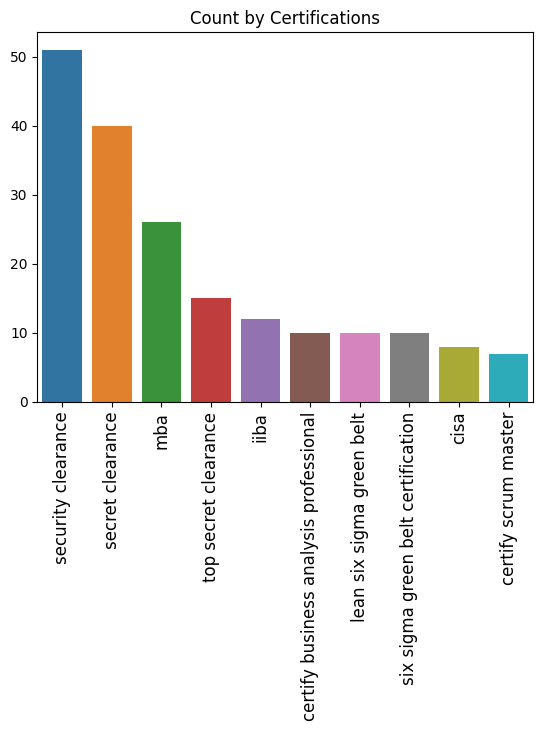

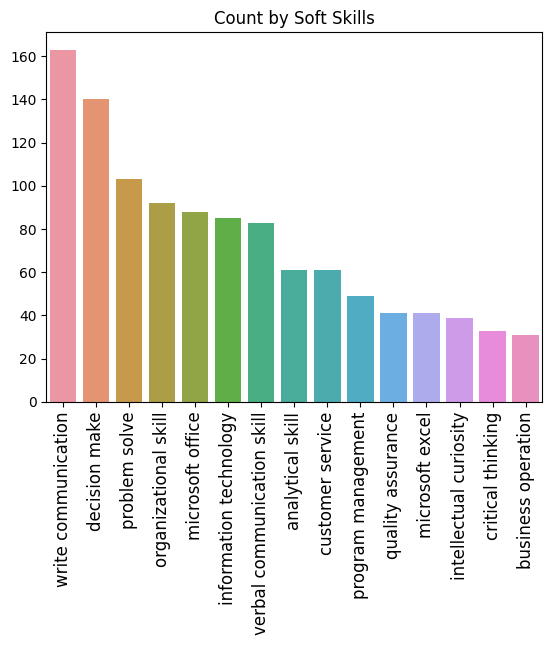

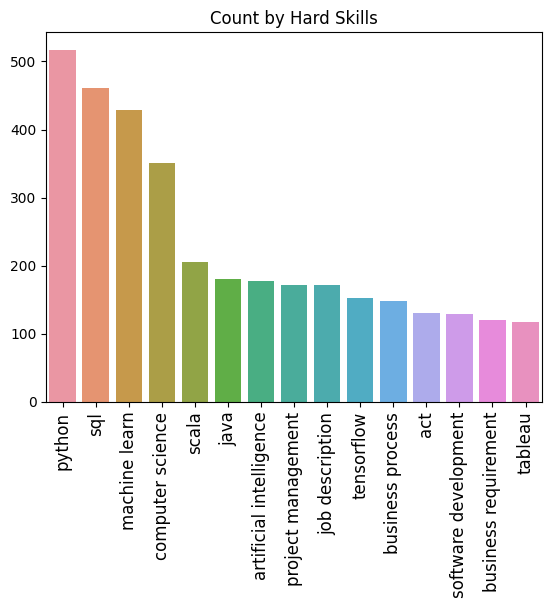

In [38]:
def plot_skills(dictionary,x_lab,title,max_skills, x_rot = 90 ):
    '''
    plot total amount of time skill appeared in descriptions (to note this approach does not consider)
    words that are double counted in descriptions
    input:
    dictionary -> dict indicating which dictionary skill
    x_lab -> str (x label)
    title -> str (title)
    x_rot = int (rotation of x label)
    max_skills -> int (number of skills to show)
    '''
    x= list(dictionary.keys())[:max_skills]
    y=list(dictionary.values())[:max_skills]

    #Make Plot
    sns.barplot(x=x,y=y)

    # Don't forget to edit x labels with it. 
    plt.xticks(rotation=x_rot,fontsize=12)
    plt.title(title)
    plt.show()

# Call Plots
plot_skills(dict_certification_skill_sorted, "Certification","Count by Certifications",10,90)
plot_skills(dict_soft_skill_sorted, "Soft_skills","Count by Soft Skills",15,90)
plot_skills(dict_hard_skill_sorted, "Hard_skills","Count by Hard Skills",15,90)

## View result in dictionary

In [39]:
dict_soft_skill_sorted

{'write communication': 163,
 'decision make': 140,
 'problem solve': 103,
 'organizational skill': 92,
 'microsoft office': 88,
 'information technology': 85,
 'verbal communication skill': 83,
 'analytical skill': 61,
 'customer service': 61,
 'program management': 49,
 'quality assurance': 41,
 'microsoft excel': 41,
 'intellectual curiosity': 39,
 'critical thinking': 33,
 'business operation': 31,
 'business administration': 29,
 'microsoft word': 28,
 'relationship management': 27,
 'team leadership': 25,
 'team build': 25,
 'interpersonal communication': 24,
 'time management': 23,
 'detail orient': 19,
 'real estate': 19,
 'people management': 17,
 'public speak': 16,
 'microsoft powerpoint': 15,
 'solution focus': 15,
 'work quickly': 13,
 'creative problem solve': 13,
 'strategic thinking': 11,
 'social medium': 9,
 'business acumen': 8,
 'retail sale': 8,
 'team management': 8,
 'goal set': 7,
 'team orient': 6,
 'constructive feedback': 2,
 'active learning': 2,
 'mobile de

In [40]:
dict_hard_skill_sorted

{'python': 517,
 'sql': 461,
 'machine learn': 428,
 'computer science': 351,
 'scala': 205,
 'java': 181,
 'artificial intelligence': 178,
 'project management': 172,
 'job description': 171,
 'tensorflow': 153,
 'business process': 148,
 'act': 131,
 'software development': 129,
 'business requirement': 120,
 'tableau': 118,
 'aiml': 114,
 'reach': 106,
 'data science': 103,
 'employee assistance program': 98,
 'software engineering': 96,
 'product management': 92,
 'unstructured datum': 89,
 'nlp': 88,
 'process improvement': 86,
 'business intelligence': 85,
 'information system': 83,
 'power bi': 81,
 'data analysis': 74,
 'financial service': 74,
 'san': 73,
 'business development': 70,
 'business analysis': 68,
 'regression': 67,
 'etl': 63,
 'customer experience': 63,
 'time series': 63,
 'keras': 62,
 'deep learning': 61,
 'crm': 60,
 'business partner': 59,
 'big datum': 58,
 'user interface': 57,
 'application development': 57,
 'business strategy': 56,
 'user experience': 5

In [41]:
dict_certification_skill_sorted

{'security clearance': 51,
 'secret clearance': 40,
 'mba': 26,
 'top secret clearance': 15,
 'iiba': 12,
 'certify business analysis professional': 10,
 'lean six sigma green belt': 10,
 'six sigma green belt certification': 10,
 'cisa': 8,
 'certify scrum master': 7,
 'dmd': 1,
 'gce': 1,
 'aicp': 1,
 'project management professional certification': 1}

## Create Table for K-mean

Based on the bar graphs and the sorted dictionary printed, we will choose skills for our analysis. We will make sure to choose from soft, hard and certification. I am not necesarly only the ones with the highest score.

In [42]:
# Write list of skills we are interested
Soft_Skills_interest = ['write communication', 'decision make',
                        'problem solve','organizational skill', 'verbal communication skill','team leadership','critical thinking']
Hard_Skills_interest = ['python','sql','machine learn', 'unsupervised learning','computer science', 'artificial intelligence',
                        'project management', 'deep learning', 'power bi', 'data analysis', 'business analysis',
                       'process improvement','etl', 'data management','computer vision',
                        'css','predictive modeling','regression','discrete event simulation','system architecture','information system','google cloud',
                       'agile software development','amazon web service','unstructured datum','apache spark','java','matlab','devops',
                        'scala','tensorflow','keras','product management','business strategy','business process','product innovation','risk management','stakeholder management']
Certification_interest = ['lean six sigma green belt', 'iiba','certify scrum master','mba','cisa']

In [43]:
df_interested_skills = df_skill_update.copy()

# Add columns to the table

for skill in Soft_Skills_interest:
    df_interested_skills[skill] = 0
    
for skill in Hard_Skills_interest:
    df_interested_skills[skill] = 0
    
for certification in Certification_interest:
    df_interested_skills[certification] = 0

df_interested_skills.head()

,Unnamed: 0,index,Title,Company,Location,Rating,Date,Salary,Description,Links,...,business strategy,business process,product innovation,risk management,stakeholder management,lean six sigma green belt,iiba,certify scrum master,mba,cisa
0,0,0,business analyst,QVC,"West Chester, OH+2 locations",3.6,PostedPosted 30+ days ago,NaN,3+ years of experience as business analyst on ...,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,...,0,0,0,0,0,0,0,0,0,0
1,1,1,business analyst,Sabot Consulting,Remote,NaN,PostedToday,$80 - $120 an hour,Preferred candidates will have prior experienc...,https://www.indeed.com/rc/clk?jk=f662b2efb509b...,...,0,0,0,0,0,0,0,0,0,0
2,2,2,business analyst,Gateway Ticketing,"Remote in Gilbertsville, PA 19525+1 location",NaN,PostedPosted 1 day ago,NaN,"ARE YOU LOOKING TO DO GREAT WORK IN A DYNAMIC,...",https://www.indeed.com/rc/clk?jk=8232a34f09ffd...,...,0,0,0,0,0,0,0,0,0,0
3,3,3,business analyst,nLeague Services Inc.,"Remote in Salem, OR 97302+3 locations",NaN,EmployerActive 2 days ago,$65 - $70 an hour,"Location: 955 Center St NE Salem, Oregon, 9730...",https://www.indeed.com/rc/clk?cmp=IT-%2F-Healt...,...,0,0,0,0,0,0,0,0,0,0
4,4,4,business analyst,RPO International,"Houston, TX 77075 (South Belt - Ellington area...",NaN,Hiring ongoing,$50 - $60 an hour,Incumbent organization who will fulfil busines...,https://www.indeed.com/company/RPO-Internation...,...,0,0,0,0,0,0,0,0,0,0


### Count Skill Appearance 

Count when the skill appears in the job description (maximum of 1 count per row)

In [44]:
def count_skill(skill,feature_name):
    count = 0
    for index,description in enumerate(df_interested_skills[feature_name]):
        if type(description) != str:
            continue 
            
        if skill in description:
            df_interested_skills.loc[index,skill] = 1
            count += 1
    
for i in Soft_Skills_interest:
    count_skill(i,'Soft Skills')
    
for i in Hard_Skills_interest:
    count_skill(i,'Hard Skills')
    
for i in Certification_interest:
    count_skill(i,'Certifications')

In [46]:
all_skill = Soft_Skills_interest + Hard_Skills_interest + Certification_interest
num_skill = len(all_skill)
df_interested_skills.iloc[:,(-num_skill+1):].head(5)

,decision make,problem solve,organizational skill,verbal communication skill,team leadership,critical thinking,python,sql,machine learn,unsupervised learning,...,business strategy,business process,product innovation,risk management,stakeholder management,lean six sigma green belt,iiba,certify scrum master,mba,cisa
0,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,1,0,0,0
2,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0


We can see that some rows, has no skills / certification in their description. We will verify if it consists of the majority or rows. If it does, we will modify some of the keyword chosen.

In [48]:
df_interested_skills_clean = df_interested_skills.copy()

index_drop = []

for i in range(len(df_interested_skills)):
    Value_Found = False
    
    for j in range(1,num_skill):
        if df_interested_skills.iloc[i,-j] != 0:
            Value_Found = True
            continue
            
    if Value_Found == False:
        index_drop.append(i)
            
print(f"There was {len(index_drop)} row(s) dropped among {len(df_interested_skills_clean)}")
df_interested_skills_clean.drop(index_drop,axis=0,inplace=True)    



There was 101 row(s) dropped among 1235


We verified that only a minority of rows had no keywords chosen in their descriptions. Hence, we will continue the analysis. We will output the table just to verify.

In [53]:
# We will use this table later on in the analysis
df_clustering1 = df_interested_skills_clean['Title'].copy()
df_clustering2 = df_interested_skills_clean[all_skill].copy()
df_clustering = pd.merge(df_clustering1, df_clustering2, left_index=True, right_index=True)
df_clustering.head()

,Title,write communication,decision make,problem solve,organizational skill,verbal communication skill,team leadership,critical thinking,python,sql,...,business strategy,business process,product innovation,risk management,stakeholder management,lean six sigma green belt,iiba,certify scrum master,mba,cisa
0,business analyst,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
1,business analyst,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,1,0,0,0
2,business analyst,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,business analyst,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,business analyst,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0


In [54]:
all_skill = Soft_Skills_interest + Hard_Skills_interest + Certification_interest

dict_df = {} # storing all groupby table in this dict

for skill in all_skill:
    dict_df[skill] = df_interested_skills_clean.groupby('Title')[skill].sum()

df_skill_summary = pd.concat(dict_df.values(),axis=1)
df_skill_summary

,write communication,decision make,problem solve,organizational skill,verbal communication skill,team leadership,critical thinking,python,sql,machine learn,...,business strategy,business process,product innovation,risk management,stakeholder management,lean six sigma green belt,iiba,certify scrum master,mba,cisa
Title,,,,,,,,,,,,,,,,,,,,,
ai engineer,10,16,4,7,6,8,1,63,35,58,...,8,8,6,0,0,0,0,0,1,0
ai system designer,0,1,15,11,8,0,0,9,1,13,...,0,0,0,0,0,0,0,0,0,0
business analyst,32,16,36,30,9,0,32,42,86,7,...,0,71,2,0,2,10,12,0,0,0
data analyst,28,8,20,11,18,0,0,25,71,1,...,2,23,0,0,0,0,0,0,0,0
data science manager,8,8,0,0,20,0,0,56,49,69,...,24,0,0,0,0,0,0,7,2,0
data scientist,29,29,1,0,11,0,0,130,107,101,...,8,20,0,11,0,0,0,0,0,0
director of analytics,22,29,24,15,2,8,0,25,34,11,...,13,16,7,0,6,0,0,0,9,0
machine learning engineer,16,0,2,9,2,0,0,120,45,130,...,0,2,0,0,0,0,0,0,0,0
manager of analytics,9,33,1,9,7,9,0,47,33,38,...,1,8,7,15,0,0,0,0,14,8


## Plot skills per job Title 

In [55]:
skill_summary = {}

for skill in all_skill:
    skill_summary[skill] = df_interested_skills_clean.groupby('Title')[skill].sum().reset_index(name='Count')

In [56]:
def plot_skills(df, x_data,y_data,x_lab,y_lab,title):
    plt.figure(figsize=(5,5))
    plot = sns.barplot(x = x_data,
               y = y_data,
               data = df)
    plot.tick_params(labelsize= 7.5)
    plt.xticks(rotation=90)
    plot.set_xlabel(x_lab, size = 7.5)
    plot.set_ylabel(y_lab, size = 7.5)
    plot.set_title(title,size = 10)

    plt.tight_layout()
    plt.show()

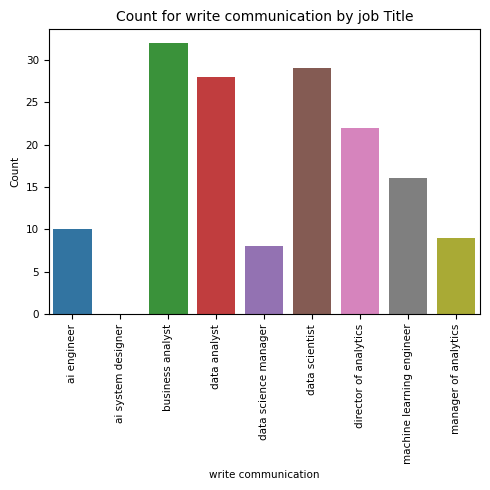

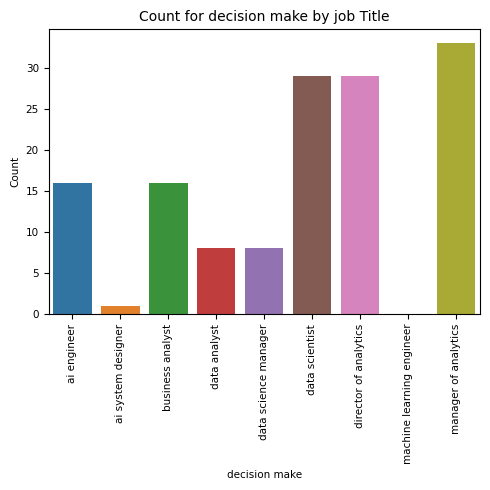

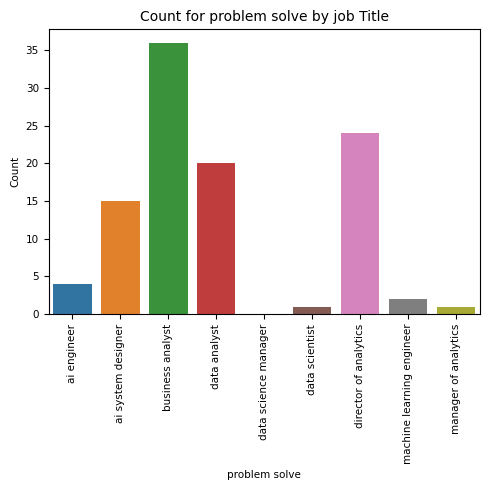

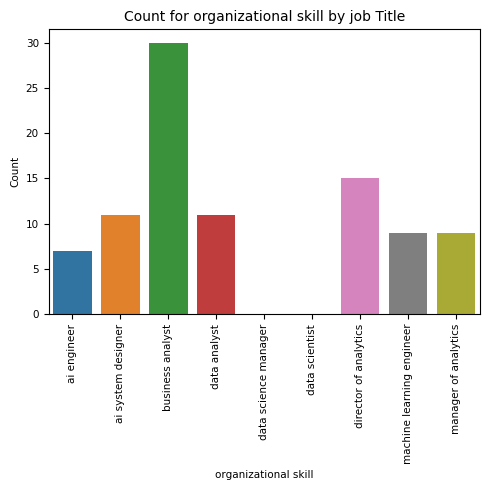

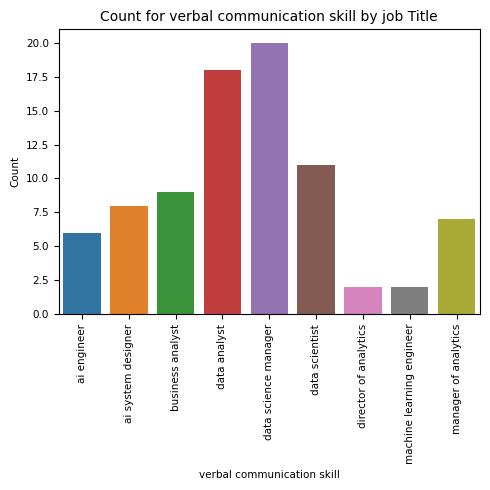

...

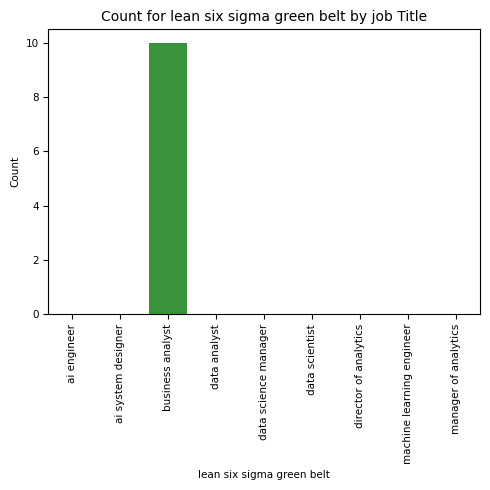

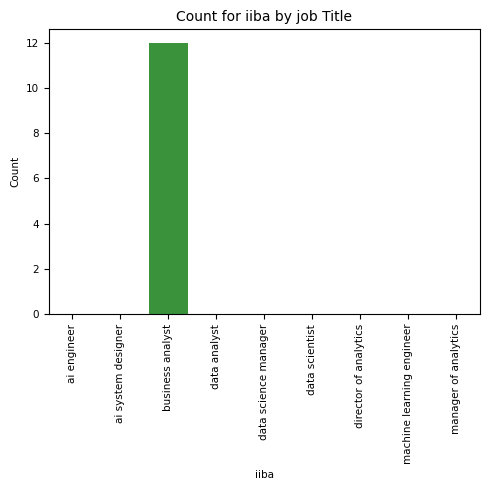

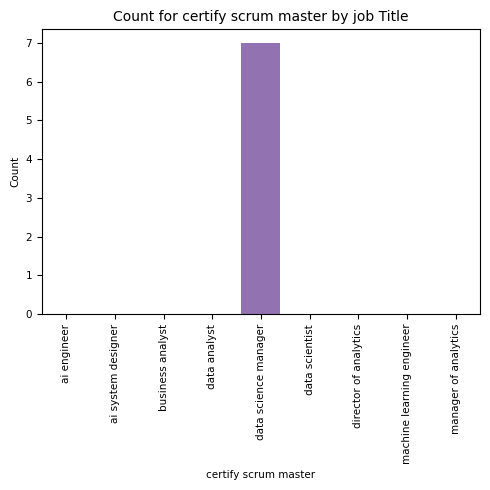

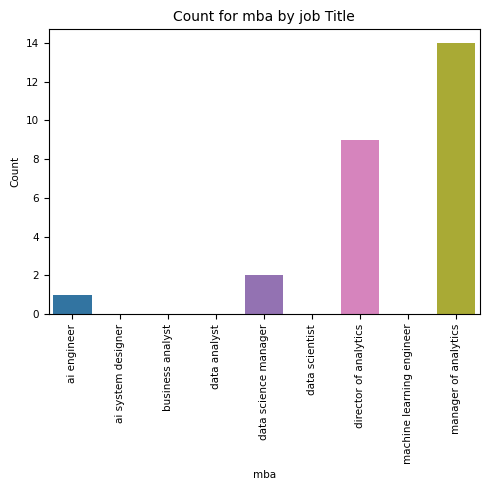

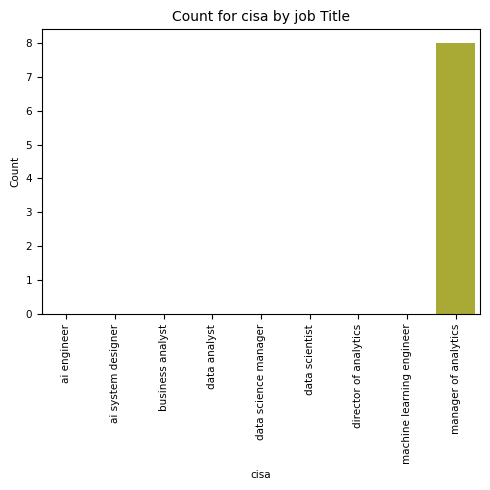

In [57]:
# Plot graph for each skills
for skill in all_skill:
    df = df_interested_skills_clean.groupby('Title')[skill].sum().reset_index(name='Count')
    x = 'Title'
    y = 'Count'
    x_lab = skill
    y_lab = 'Count'
    title = 'Count for ' + skill + ' ' + 'by job Title'


    plot_skills(df, x,y,x_lab,y_lab,title)

# Hierachical clustering implementations

The following code was used from https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html and necessary modification were made for our case.

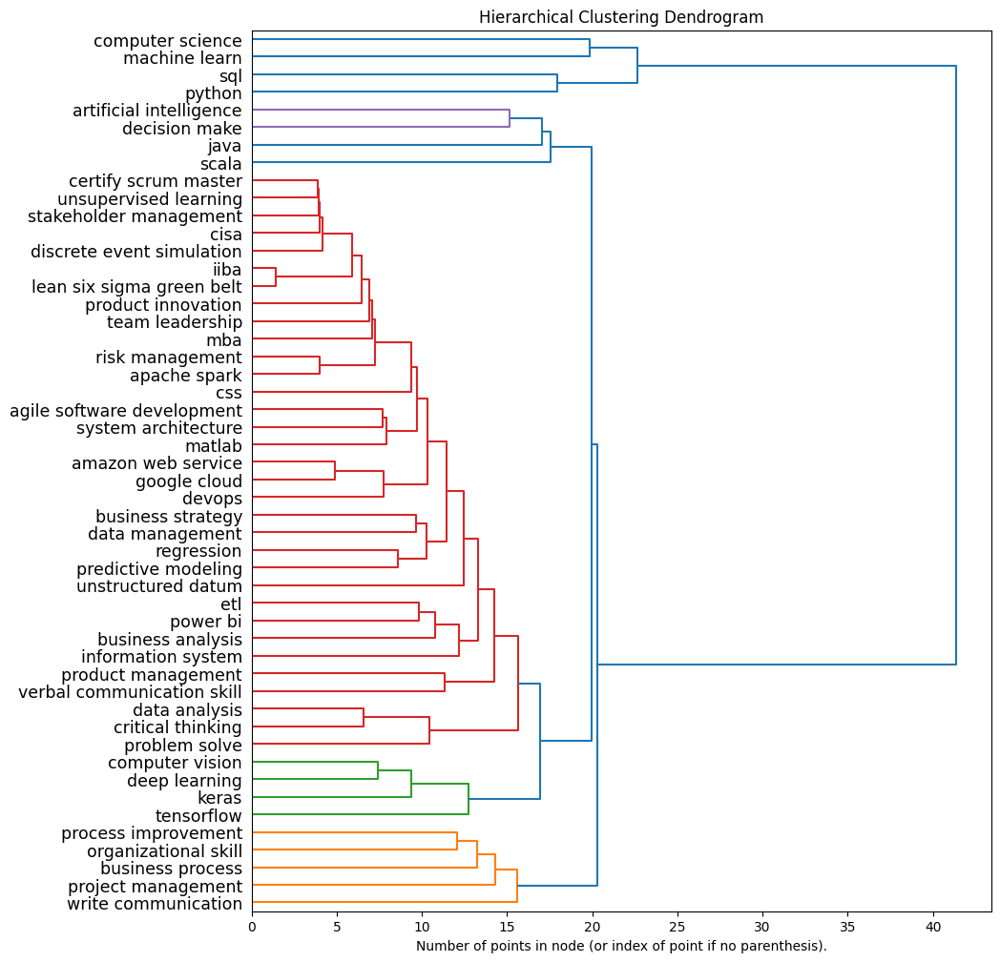

In [58]:
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix,labels=index, **kwargs)


# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)

X = df_clustering.loc[:, df_clustering.columns != 'Title']
X_t = X.transpose()
index = X_t.index.to_list()

model = model.fit(X_t)

plt.figure(figsize=(10,12))
plt.title("Hierarchical Clustering Dendrogram")
# plot the top three levels of the dendrogram
plot_dendrogram(model, orientation='right' ,truncate_mode="level", color_threshold=16,show_contracted=True)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.yticks(fontsize=12.5, rotation=0)
plt.show()


## K Means Clustering

### Feature Engineering 

#### Extract Salary 

In [59]:
df_k_mean = df_interested_skills_clean.copy() 
df_k_mean = df_k_mean.drop('index',axis=1)
df_k_mean =df_k_mean.drop('Unnamed: 0',axis=1)
df_k_mean = df_k_mean.reset_index(drop=True)

In the following code, we want to convert all salary to the same unit $/year. For the salary given by hour, we calculate the average of the range they gave and multiple by 2000 (rule of thumb to convert hourly pay to yearly salary). 

In [60]:
# Convert salary to int and calculate average of range
round_num_hrl = 5 # We want to approximate salary by 5$ an hour 
round_num_yrl = 10000 # We want to approximate salary by 10 000$ / year

for i in range(len(df_k_mean)):
    if type(df_k_mean['Salary'][i]) == str: # Ignore NaN 
        df_k_mean.loc[i,'Salary'] = df_k_mean['Salary'][i].replace(",","") # remove , seperating yearly salary
        salary_range = re.findall(r'\d+', df_k_mean['Salary'][i])
        salary_range = [int(i) for i in salary_range]
        salary_average = sum(salary_range) / len(salary_range)
        
        if 'hour' in df_k_mean['Salary'][i]:
            salary_average = int(round(salary_average/round_num_hrl)*round_num_hrl) # round hourly salary by 5$ / hour
            salary_average = salary_average * 2000 # Convert to yearly salary (rule of thumb yearly salary = hourly x 2000)
        else:
            salary_average = int(round(salary_average/round_num_yrl)*round_num_yrl) # round hourly salary by 10 000/year
        
        df_k_mean.loc[i,'Salary'] = salary_average # Assume the rest is yearly salary     
           




#### Seperate City and State

In [61]:
# Seperate Location into City and State
df_k_mean['City'] = None
df_k_mean['State'] = None

for i in range(len(df_k_mean)):
    location = df_k_mean['Location'][i]

    # For city
    city=re.findall('(\S*)[,]', location)
    
    # For state
    state = re.findall(r'(?<=,\s)[a-z]+',location,re.I)
    
    
    if city == [] or state ==[]:
        df_k_mean.loc[i,'City'] = 'remote'
        df_k_mean.loc[i,'State'] = 'remote'
        
    else:
        df_k_mean.loc[i,'City'] = city[0]
        df_k_mean.loc[i,'State'] = state[0] 

df_skills_extract = df_k_mean

#### Features for degrees

In the following code, we count whether the word bachelor or master appeared in the job description.

In [62]:
# We will create a column for bachelors and one for masters. If this name appears in the description, it will appear as 1
df_k_mean['bachelor'] = 0
df_k_mean['master'] = 0

for i in range(len(df_k_mean)):
    bachelor = ('bachelor' in df_k_mean['Descriptions'][i])
    master = ('master' in df_k_mean['Descriptions'][i])
    if bachelor == True:
        df_k_mean.loc[i,'bachelor'] = 1
    if master == True:
        df_k_mean.loc[i,'master'] = 1
    
        

#### Replacing missing values

In [63]:
# Replace missing values for Salary and Rating by most_frequent
imputer = SimpleImputer(strategy="most_frequent") # we can easily change to mean, median, or most_frequent
imputer.fit(df_k_mean)
X = imputer.transform(df_k_mean)
df_k_mean = pd.DataFrame(X, columns=df_k_mean.columns,index=df_k_mean.index)

In [64]:
k_features = ['Title','Rating','Salary','Soft Skills','Hard Skills','Certifications','City','State','bachelor','master','Descriptions']
df_k1 = df_k_mean[k_features].copy()

### Build K-mean Table 

In [65]:
# Build a table with the desired skills as rows and sumarry of the 10 features
df_k_final = pd.DataFrame(all_skill,columns=["Skills"])

In [66]:
def calculate_feature_num(feature,rounding,rounding_method = True):
    '''
    The purpose of this function is to calculate the average of the feature for each skills
    Input:
    skill_list -> list of all interested skills (from 3 listed created above)
    skill type -> str (feature name to look for skill)
    feature -> str
    rounding_method -> Boolean (two methods)
    '''
    
    feature_list = []

    for skill in all_skill:
        df_skill = df_k1[df_k1['Soft Skills'].str.contains(skill) | df_k1['Hard Skills'].str.contains(skill) | df_k1['Certifications'].str.contains(skill)]
        feature_mean = df_skill[feature].mean()

        if math.isnan(feature_mean):
            rating = 0 
            
        if rounding_method == True:
            feature_mean = int(round(feature_mean/rounding)*rounding)   
            
        else:
            feature_mean = round(feature_mean,rounding)
        feature_list.append(feature_mean)
    
    
        

    column_values = pd.Series(feature_list)
    loc_num = len(df_k_final.columns)
    try:
        df_k_final.insert(loc=loc_num, column= feature + ' ' + 'avg', value=column_values)
    except:
        print(f"Warning, the column name already exists")

In [67]:
def calculate_feature_cat(feature):
    '''
    The purpose of this function is to calculate the average of the feature for each skills
    Input:
    skill_list -> list of all interested skills (from 3 listed created above)
    skill type -> str (feature name to look for skill)
    feature -> str
    rounding_method -> Boolean (two methods)
    '''
    
    feature_list = []

    for skill in all_skill:
        df_skill = df_k1[df_k1['Soft Skills'].str.contains(skill) | df_k1['Hard Skills'].str.contains(skill) | df_k1['Certifications'].str.contains(skill)]
        
        #df_skill = df_skill[feature].fillna("")
        feature_mode = df_skill[feature].mode()
        
        feature_list.append(feature_mode[0])
    
    column_values = pd.Series(feature_list)
    loc_num = len(df_k_final.columns)
    try:
        df_k_final.insert(loc=loc_num, column= feature, value=column_values)
    except:
        print(f"Warning, the column name already exists")

In [68]:
def skill_type(interest_list,feature):
    skill_list = []
    for skill in all_skill:
        if skill in interest_list:
            skill_list.append(1)
        else:
            skill_list.append(0)
            
    column_values = pd.Series(skill_list)
    loc_num = len(df_k_final.columns)
    try:
        df_k_final.insert(loc=loc_num, column= feature, value=column_values)
    except:
        print(f"Warning, the column name already exists")     

In [69]:
# Add numerical feature summary
calculate_feature_num('Salary',10000)
calculate_feature_num('Rating',1,False)
calculate_feature_num('bachelor',1,False)
calculate_feature_num('master',1,False)

In [70]:
# Add categorical feature summary
calculate_feature_cat('Title')
calculate_feature_cat('City')
calculate_feature_cat('State')

In [71]:
skill_type(Soft_Skills_interest, 'Soft Skill') 
skill_type(Hard_Skills_interest, 'Hard Skill')
skill_type(Certification_interest, 'Certification')

In [72]:
df_k_final.head()

,Skills,Salary avg,Rating avg,bachelor avg,master avg,Title,City,State,Soft Skill,Hard Skill,Certification
0,write communication,120000,3.9,0.3,0.2,machine learning engineer,remote,remote,1,0,0
1,decision make,120000,3.7,0.4,0.2,manager of analytics,remote,remote,1,0,0
2,problem solve,110000,3.8,0.2,0.1,business analyst,remote,remote,1,0,0
3,organizational skill,110000,3.6,0.5,0.1,business analyst,Iselin,NJ,1,0,0
4,verbal communication skill,120000,3.6,0.4,0.0,data science manager,remote,remote,1,0,0


We obtain a table that has our desired skills as rows and 10 features.

### K-means encoded

Since the features contains categorical and numerical data, we will one hot encode the data.

In [73]:
df_k_encoded = pd.get_dummies(data=df_k_final, columns=['Title','City','State'])
df_k_encoded.head()

,Skills,Salary avg,Rating avg,bachelor avg,master avg,Soft Skill,Hard Skill,Certification,Title_ai engineer,Title_ai system designer,...,State_FL,State_IL,State_MA,State_MD,State_MN,State_NJ,State_TX,State_VA,State_WA,State_remote
0,write communication,120000,3.9,0.3,0.2,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,decision make,120000,3.7,0.4,0.2,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,problem solve,110000,3.8,0.2,0.1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,organizational skill,110000,3.6,0.5,0.1,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,verbal communication skill,120000,3.6,0.4,0.0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


### Elbow Method 

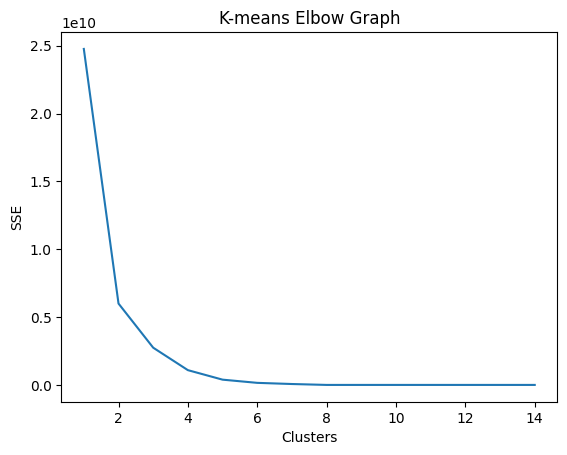

In [75]:
# Preperare data
X = df_k_encoded.iloc[:,1:]
#elbow method
wcss = []
for i in range(1,15):
    k_means = KMeans(n_clusters=i,init='k-means++', random_state=42)
    k_means.fit(X)
    wcss.append(k_means.inertia_)
#plot elbow curve
plt.plot(np.arange(1,15),wcss)
plt.xlabel('Clusters')
plt.ylabel('SSE')
plt.title('K-means Elbow Graph')
plt.show()

Looking at the K-mean Elbow graph, I decided to use 4 clusters. I was also keeping in mind that I will need to create a curriculum of 8-12 courses.

In [76]:
n_cluster = 4
clustering_kmeans = KMeans(n_clusters=n_cluster,random_state=0)
X['clusters'] = clustering_kmeans.fit_predict(X)
df1 = X['clusters']
df2 = df_k_encoded['Skills']

## K-means clustering result 

In [77]:
#Cluster results
df_cluster = pd.merge(df1, df2, left_index=True, right_index=True)
df_cluster_sort = df_cluster.sort_values(by=['clusters'])

In [78]:
df_cluster_sort

,clusters,Skills
43,0,risk management
44,0,stakeholder management
40,0,business strategy
20,1,data management
21,1,computer vision
22,1,css
23,1,predictive modeling
41,1,business process
25,1,discrete event simulation
27,1,information system


In [79]:
df_cluster['clusters'].value_counts()

1    30
3    14
0     3
2     3
Name: clusters, dtype: int64

## K-mean visualization (swarmplot) 

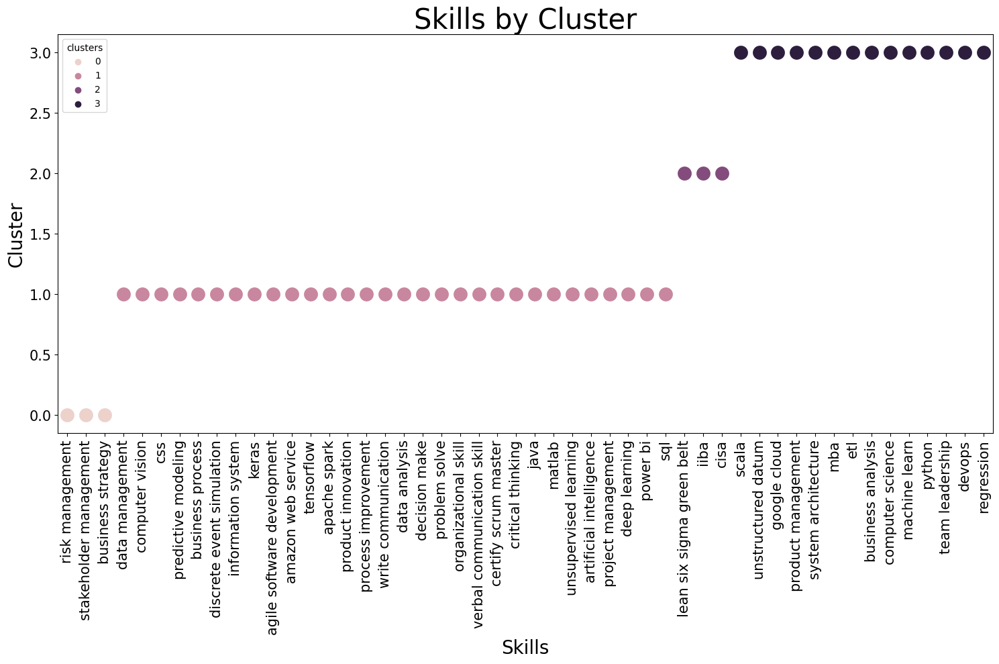

In [80]:
plt.figure(figsize=(15,10))
plot = sns.swarmplot(x="Skills",
                  y="clusters",
                  data=df_cluster_sort,
                  hue="clusters",
                    size = 15)

plot.tick_params(labelsize= 15)
plt.xticks(rotation=90)
plot.set_xlabel('Skills', size = 20)
plot.set_ylabel('Cluster', size = 20)
plot.set_title('Skills by Cluster',size = 30)

plt.tight_layout()
plt.show()
